# Кейс Анализ обратной связи, как в СБЕРЕ. + SaluteSpeech API

Ссылка на сайт с аудио звонками для тестирования:
https://sphr.online/projects/audiozapisi.php 

**Процесс автоматизации, ШАГИ, что необходимо сделать:**
1. Подгружаем необходимые библиотеки (список нижен). Если библиотеки не установлены, производим установку через !pip install
2. Получаем доступ к студии разработчика **GIGACHAT API**, **SaluteSpeech API** + сохраняем ключи для взаимодействия

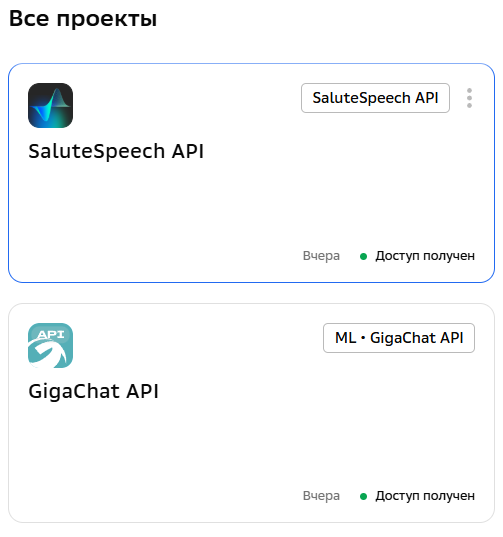

3. Создаем своего бота через **BotFather** + сохраняем ключ для взаимодействия

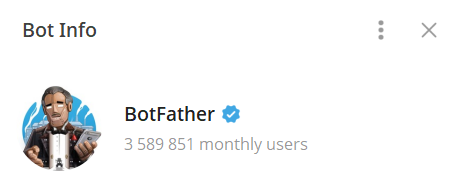

4. Создаем нужные функции для взаимодействия по API + дробление аудио
5. Отправляем по очереди куски аудио в **SaluteSpeech API** и полученный результат объединяем в общий текст аудио
6. Создаем свой промт, объединяем его с преобразованным текстом, отправляем в **GIGACHAT API**
7. Полученный результат озвучиваем через **SaluteSpeech API**
8. Создаем функцию для отправки результатов в наш бот
9. Отправляем полученный результат в наш ТГ БОТ

### Радуемся, что смогли заставить нейросети работать на себя

*Пример загрузки библиотеки*

In [10]:
#!pip install pydub

In [11]:
#!pip install python-telegram-bot --quiet

In [12]:
#!pip install aiogram

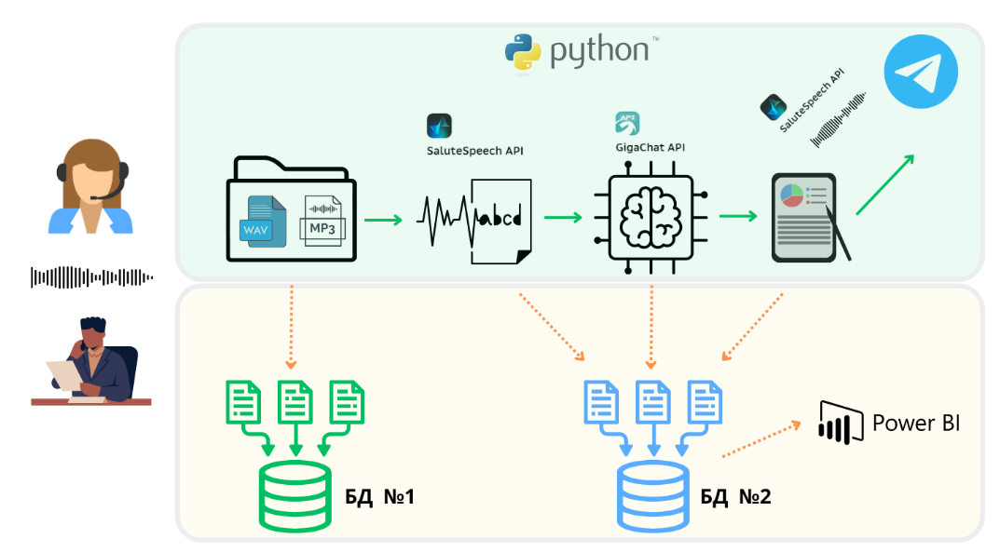

In [1]:
from dotenv import load_dotenv
import os

In [2]:
import requests
import uuid
from pydub import AudioSegment
import requests
from IPython.display import Audio
from IPython.display import display, Markdown
import json
#from telegram import Bot
import re
from aiogram import Bot
import asyncio
from aiogram.types import InputFile
from aiogram.types import FSInputFile

In [3]:
from langchain.schema import HumanMessage, SystemMessage
from langchain.chat_models.gigachat import GigaChat

In [4]:
import time

In [6]:
import warnings
warnings.filterwarnings('ignore')

In [7]:
load_dotenv("getenv.env.txt")  # Указываем явно путь к файлу

True

In [8]:
#CLIENT_ID = "ТВОЙ ID"
#CLIENT_SECRET = "ТВОЙ ID"
SCOPE = os.getenv("SCOPE") # или GIGACHAT_API_CORP
AUTHORIZATION_KEY = os.getenv("AUTHORIZATION_KEY") # GIGACHAT API
AUTH_SPEECH = os.getenv("AUTH_SPEECH") # Для speech API
# Токен бота
TOKEN_BOT = os.getenv("TOKEN_BOT")
CHAT_ID = os.getenv("CHAT_ID")

**Получение токена для Salute speech**

In [9]:
def get_token(auth_token, scope='SALUTE_SPEECH_PERS'):
    """
      Выполняет POST-запрос к эндпоинту, который выдает токен.

      Параметры:
      - auth_token (str): токен авторизации, необходимый для запроса.
      - область (str): область действия запроса API. По умолчанию — «SALUTE_SPEECH_PERS».

      Возвращает:
      - ответ API, где токен и срок его "годности".
      """
    # Создадим идентификатор UUID (36 знаков)
    rq_uid = str(uuid.uuid4())

    # API URL
    url = "https://ngw.devices.sberbank.ru:9443/api/v2/oauth"

    # Заголовки
    headers = {
        'Content-Type': 'application/x-www-form-urlencoded',
        'RqUID': rq_uid,
        'Authorization': f'Basic {auth_token}'
    }
    # Тело запроса
    payload = {
        'scope': scope
    }
    try:
        # Делаем POST запрос с отключенной SSL верификацией
        # (можно скачать сертификаты Минцифры, тогда отключать проверку не надо)
        response = requests.post(url, headers=headers, data=payload, verify=False)
        return response
    except requests.RequestException as e:
        print(f"Ошибка: {str(e)}")
        return None

Получим токен доступа.

In [10]:
response = get_token(AUTH_SPEECH)
if response != None:
    salute_token = response.json()['access_token']

Вот так будет выглядеть функция, которая открывает на чтение WAV-файл и передает данные по API. В качестве результата функция извлекает текст распознанной речи.

**Функция отправки аудио SaluteSpeech API**

In [11]:
def stt(file_path, token):
    # URL для распознавания речи
    url = "https://smartspeech.sber.ru/rest/v1/speech:recognize"

    # Заголовки запроса
    headers = {
        "Authorization": f"Bearer {token}",
        #"Content-Type": "audio/x-pcm;bit=16;rate=16000"
        "Content-Type": "audio/mpeg"
    }
    # Открытие аудио файла в бинарном режиме
    with open(file_path, "rb") as audio_file:
        audio_data = audio_file.read()

    # Отправка POST запроса
    response = requests.post(url, headers=headers, data=audio_data, verify=False)

    # Обработка ответа
    if response.status_code == 200:
        result = response.json()
        print("Весь ответ API:", result)
        return result["result"]
    else:
        print("Ошибка:", response.status_code, response.text)
        return response.text

In [12]:
# Режем аудио на кусочки
def split_audio(file_path, segment_duration=59*1000):  # segment_duration в миллисекундах (по умолчанию — 59 секунд)
    audio = AudioSegment.from_file(file_path)  # Загружаем аудиофайл
    segments = []  # Список для хранения путей к сегментам

    for i in range(0, len(audio), segment_duration):  # Проходим по всему аудио с шагом segment_duration
        chunk = audio[i:i+segment_duration]  # Вырезаем фрагмент
        segment_path = f"segment_{i//segment_duration}.mp3"  # Задаем имя для сегмента
        chunk.export(segment_path, format="mp3")  # Сохраняем сегмент в формате mp3
        segments.append(segment_path)  # Добавляем путь к файлу в список

    return segments  # Возвращаем список всех сегментированных файлов

In [13]:
# Функция синтеза речи
def synthesize_speech(text, token, format='wav16', voice='Bys_24000'):
    url = "https://smartspeech.sber.ru/rest/v1/text:synthesize"
    headers = {
        "Authorization": f"Bearer {token}",
        "Content-Type": "application/text"
    }
    params = {
        "format": format,
        "voice": voice
    }
    response = requests.post(url, headers=headers, params=params, data=text.encode(), verify=False)

    if response.status_code == 200:
        # Сохранение синтезированного аудио в файл
        with open('output.wav', 'wb') as f:
            f.write(response.content)
        print("Аудио успешно синтезировано и сохранено как 'output.wav'")

In [14]:
# Создание клиента для взаимодействия с моделью GigaChat через API.
giga = GigaChat(
    credentials=AUTHORIZATION_KEY,          # Ключ авторизации для доступа к GigaChat API
    #model='GigaChat:latest',                # Указание версии модели, используется самая новая ('latest')
    model = 'GigaChat-2-Pro:latest',
    verify_ssl_certs=False                  # Отключение проверки SSL-сертификатов (НЕ рекомендуется в проде)
)

In [15]:
giga.get_models()

Models(data=[Model(id_='GigaChat', object_='model', owned_by='salutedevices'), Model(id_='GigaChat-2', object_='model', owned_by='salutedevices'), Model(id_='GigaChat-2-Max', object_='model', owned_by='salutedevices'), Model(id_='GigaChat-2-Max-preview', object_='model', owned_by='salutedevices'), Model(id_='GigaChat-2-Pro', object_='model', owned_by='salutedevices'), Model(id_='GigaChat-2-Pro-preview', object_='model', owned_by='salutedevices'), Model(id_='GigaChat-2-preview', object_='model', owned_by='salutedevices'), Model(id_='GigaChat-Max', object_='model', owned_by='salutedevices'), Model(id_='GigaChat-Max-preview', object_='model', owned_by='salutedevices'), Model(id_='GigaChat-Plus', object_='model', owned_by='salutedevices'), Model(id_='GigaChat-Plus-preview', object_='model', owned_by='salutedevices'), Model(id_='GigaChat-Pro', object_='model', owned_by='salutedevices'), Model(id_='GigaChat-Pro-preview', object_='model', owned_by='salutedevices'), Model(id_='GigaChat-preview

### У нас есть записанный звонк общения клиента с колл-центром

**Лаборатория Касперского** (сайт https://sphr.online/projects/audiozapisi.php)

*Цель звонка:*
Теплая база. Задача оператора обработать запросы, поступающие в СРМ Заказчика, провести консультацию и назначить ответсвенного для помощи клиенту

In [17]:
Audio('lab_casper.mp3')

#### Функция Split дробит аудио на фрагменты. SaluteSpeech API принимает на вход аудио не более 1 минуты.

In [18]:
audio_sp_segm = split_audio('lab_casper.mp3')

In [19]:
audio_sp_segm

['segment_0.mp3', 'segment_1.mp3', 'segment_2.mp3', 'segment_3.mp3']

In [20]:
for row in audio_sp_segm:
    display(Audio(row))

#### Данная функция отправлять аудио файл по API для преобразования голоса в текст и возвращает преобразованное аудио и прописывает тональность разговора. Положительное/Нейтральное/Негативное. Далее полученный результат преобразованного аудио записываем в одну текстовую переменную full_text

In [21]:
text_parts = []  # сюда будем складывать текст

for segment in audio_sp_segm:
    result = stt(segment, salute_token)  # отправляем в API

    if isinstance(result, list):  # если результат — список слов/фраз
        result_text = " ".join(result)
    else:
        result_text = str(result)
    text_parts.append(result_text)  # добавляем к общему тексту
    time.sleep(4)  # задержка, чтобы не спамить API

full_text = " ".join(text_parts)  # склеиваем всё в один текст
print(full_text)

Весь ответ API: {'result': ['Да, добрый день. Добрый. Меня зовут Айкуль. Это звонок из лаборатории касперского Москва. Добрый день. 1 Калинин. Правильно? Да, верно. Очень приятно. Вы ранее заполнили форму на сайте лаборатории касперского. Подскажите, пожалуйста, чем я могу вам помочь? Такой вопрос. Я хотел бы уточнить по поводу схемы лицензирования. Как', 'Мне это обсчитать есть endpoint security для бизнеса стандартный, наверное, 1 вопрос как на файловые сервера, просто как отдельная лицензия рассчитывается.', 'Так, ваш вопрос услышала. Да, касперский анн, поинти, ируете для бизнес стандартных порядок лицензирования от 10 устройств, то есть минимальное количество это 10. И здесь неважно, какое количество файловых серверов, такое количество рабо.'], 'emotions': [{'negative': 0.002244761, 'neutral': 0.98946357, 'positive': 0.008291612}, {'negative': 0.00012253725, 'neutral': 0.9994554, 'positive': 0.00042215077}, {'negative': 0.00075404946, 'neutral': 0.99666286, 'positive': 0.002583068

In [22]:
full_text

'Да, добрый день. Добрый. Меня зовут Айкуль. Это звонок из лаборатории касперского Москва. Добрый день. 1 Калинин. Правильно? Да, верно. Очень приятно. Вы ранее заполнили форму на сайте лаборатории касперского. Подскажите, пожалуйста, чем я могу вам помочь? Такой вопрос. Я хотел бы уточнить по поводу схемы лицензирования. Как Мне это обсчитать есть endpoint security для бизнеса стандартный, наверное, 1 вопрос как на файловые сервера, просто как отдельная лицензия рассчитывается. Так, ваш вопрос услышала. Да, касперский анн, поинти, ируете для бизнес стандартных порядок лицензирования от 10 устройств, то есть минимальное количество это 10. И здесь неважно, какое количество файловых серверов, такое количество рабо. Станция это на лицензия, да, то есть в состав продуктов входит защита мобильных устройств, защита рабочих станций, защита сервера и также есть консоль администрирования, то есть централизованное управление. Это будет 1 лицензия. Вы оплачиваете кони. А а, консоль, она облачной 

### Создаем свой промт

In [23]:
promt_text = "Ты маркетолог, который анализирует звонки, поступающие в колл-центр. \
Твоя задача понять: 1. Корневую причину обращения. 2. Решена или не решена проблема. \
3. Понять, как настроен клиент. Положительно, Нейтрально, Отрицательно. \
4. Достигнута ли цель? Цель звонка: Теплая база. Задача оператора обработать запросы, поступающие в СРМ Заказчика, провести консультацию и назначить ответсвенного для помощи клиенту\
Пиши по пунктам ответ на каждый вопрос. Делай нумерацию и дублируй сам вопрос, а потом на него отвечай"

In [24]:
text_to_giga = promt_text + ". Текст диалога клиента с колл-центром: " + full_text

In [25]:
text_to_giga

'Ты маркетолог, который анализирует звонки, поступающие в колл-центр. Твоя задача понять: 1. Корневую причину обращения. 2. Решена или не решена проблема. 3. Понять, как настроен клиент. Положительно, Нейтрально, Отрицательно. 4. Достигнута ли цель? Цель звонка: Теплая база. Задача оператора обработать запросы, поступающие в СРМ Заказчика, провести консультацию и назначить ответсвенного для помощи клиентуПиши по пунктам ответ на каждый вопрос. Делай нумерацию и дублируй сам вопрос, а потом на него отвечай. Текст диалога клиента с колл-центром: Да, добрый день. Добрый. Меня зовут Айкуль. Это звонок из лаборатории касперского Москва. Добрый день. 1 Калинин. Правильно? Да, верно. Очень приятно. Вы ранее заполнили форму на сайте лаборатории касперского. Подскажите, пожалуйста, чем я могу вам помочь? Такой вопрос. Я хотел бы уточнить по поводу схемы лицензирования. Как Мне это обсчитать есть endpoint security для бизнеса стандартный, наверное, 1 вопрос как на файловые сервера, просто как от

### Отправляем промт с текстом и получаем ответ от ГИГИ

In [26]:
msgs = []
msgs.append(HumanMessage(content=text_to_giga))
answer = giga(msgs)
msgs.append(answer)
print('Ответ ИИ:', display(Markdown(answer.content)))

**1. Корневая причина обращения**
Клиент обратился за разъяснением по схеме лицензирования продукта «Kaspersky Endpoint Security для бизнеса», интересуясь особенностями расчета лицензий для файловых серверов и деталями работы консоли управления.

**2. Решена или не решена проблема**
Проблема частично решена. Клиенту предоставили общие сведения по порядку лицензирования и работе консоли управления, однако были заданы дополнительные уточняющие вопросы (например, относительно способа получения уведомлений), на которые оператор не смог ответить подробно. В итоге клиент был направлен к специалисту второго уровня.

**3. Настроение клиента**
Нейтральное. Клиент вежлив, благодарит оператора, но очевидно ожидает дальнейшей консультации после перевода к другому сотруднику.

**4. Достигнута ли цель**
Цель достигнута частично. Звонок был квалифицирован оператором, клиент получил первичную консультацию и был переведен на следующего сотрудника (менеджера). Однако для полного решения вопроса требуется дальнейшая работа со специалистом второго уровня.

Ответ ИИ: None


## **Синтез речи**

In [27]:
synthesize_speech(answer.content, salute_token)

Аудио успешно синтезировано и сохранено как 'output.wav'


In [29]:
answer.content

'**1. Корневая причина обращения**\nКлиент обратился за разъяснением по схеме лицензирования продукта «Kaspersky Endpoint Security для бизнеса», интересуясь особенностями расчета лицензий для файловых серверов и деталями работы консоли управления.\n\n**2. Решена или не решена проблема**\nПроблема частично решена. Клиенту предоставили общие сведения по порядку лицензирования и работе консоли управления, однако были заданы дополнительные уточняющие вопросы (например, относительно способа получения уведомлений), на которые оператор не смог ответить подробно. В итоге клиент был направлен к специалисту второго уровня.\n\n**3. Настроение клиента**\nНейтральное. Клиент вежлив, благодарит оператора, но очевидно ожидает дальнейшей консультации после перевода к другому сотруднику.\n\n**4. Достигнута ли цель**\nЦель достигнута частично. Звонок был квалифицирован оператором, клиент получил первичную консультацию и был переведен на следующего сотрудника (менеджера). Однако для полного решения вопро

In [28]:
Audio("output.wav")

### Отправка сообщение через бота

### Взаимодействие с ботом через спец библиотеки

In [30]:
async def send_all(token, chat_id, text, file):
    async with Bot(token=token) as bot:
        await bot.send_message(chat_id=chat_id, text=text, parse_mode='Markdown')
        
        audio_file = FSInputFile(file)
        await bot.send_audio(chat_id=chat_id, audio=audio_file, caption="*Аудиофайл*", parse_mode='Markdown')

In [31]:
# отправка сообщения в БОТ ТГ
await send_all(token = TOKEN_BOT, chat_id = CHAT_ID, text = answer.content, file = 'output.wav')

In [47]:
#await bot.session.close()

In [48]:
bot = 0

In [49]:
#await bot.send_message(chat_id=CHAT_ID, text="Проверка")

### Другой способ взаимодействовать с ботом, можете тоже попробовать

In [32]:
#TEXT = "Привет! Это сообщение из Jupyter 😊"

In [33]:
#def escape_markdown_v2(text):
#    escape_chars = r'_*\[\]()~`>#+=|{}.!-'
#    return re.sub(f'([{re.escape(escape_chars)}])', r'\\\1', text)

In [34]:
#def notify_text(text, token, chat_id):
#    url = f'https://api.telegram.org/bot{token}/sendMessage'
    #escaped_text = escape_markdown_v2(text)
#    requests.get(url, params={'chat_id': chat_id, 'text': text, 'parse_mode': 'MarkdownV2'})

In [35]:
#text_markdown = answer.content

In [36]:
#text_markdown

In [37]:
#notify_text(text = text_markdown, token = TOKEN_BOT, chat_id = CHAT_ID)

In [38]:
#def notify_audio(file, token, chat_id):
#    url = f'https://api.telegram.org/bot{token}/sendAudio'
#    files = {'audio': open(file, 'rb')}
#    requests.post(url, files=files, data={'chat_id': chat_id})

In [39]:
#notify_audio(file = 'output.wav', token = TOKEN_BOT, chat_id = CHAT_ID)